# <center>**Early Detection of Eye Diseases Using Deep Learning:**

## <center>**A Vision-Based Approach for Timely Diagnosis**


  ##  <Center>By Prince (19MIA1079)
   ##  <Center>Review -2

<img src="https://www.mississippivision.com/wp-content/uploads/diabetic-retinopathy-1-2048x902.jpeg" style="width:100%">

<img src="https://static.vecteezy.com/system/resources/previews/005/860/683/original/illustration-of-a-healthy-eye-glaucoma-cataract-vector.jpg" style="width:100%">

The primary objective of eye disease classification is to leverage deep learning techniques to analyze medical images and detect the four diseases: cataract, diabetic retinopathy, glaucoma, normal
# About the diseases

1. **Cataract**: Cataract is a common age-related eye condition characterized by the clouding of the lens, leading to blurry vision and visual impairment. It can be treated surgically by replacing the cloudy lens with an artificial one, restoring clear vision and improving quality of life.

2. **Diabetic Retinopathy**: Diabetic retinopathy is a complication of diabetes that affects the blood vessels in the retina. It can cause vision loss, including blurred or distorted vision, and in severe cases, lead to blindness. Early detection, regular eye exams, and proper management of diabetes are crucial for preventing and managing this condition.

3. **Glaucoma**: Glaucoma is a group of eye diseases that damage the optic nerve, often due to increased fluid pressure in the eye. It gradually leads to vision loss, starting with peripheral vision and potentially progressing to complete blindness. Timely diagnosis, treatment, and ongoing monitoring are vital for preserving vision and preventing irreversible damage.

**Early diagnosis and treatment of eye diseases can preserve eyesight.**



## Import Libraries

In [1]:
import os
import cv2
import random
import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from PIL import Image
from tensorflow import keras
from tensorflow.keras import layers
from torchvision.utils import make_grid
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adamax, Adam
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, BatchNormalization, Dense, Dropout
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB3, ResNet50, InceptionV3
from tensorflow.keras import layers, Sequential, callbacks
from tensorflow.keras.optimizers import Adam
from pathlib import Path

import warnings
warnings.filterwarnings('ignore')

'cpu'

## Data Collection & Preprocessing 🛠️

In [2]:
# Define dataset path
dataset_path = 'D:/Capstone Project/dataset'

# Function to process images and create DataFrame
def process_img(filepath):
    jpg_files = list(Path(filepath).glob('**/*.jpg'))
    png_files = list(Path(filepath).glob('**/*.png'))
    jpeg_files = list(Path(filepath).glob('**/*.jpeg'))
    all_files = jpg_files + png_files + jpeg_files
    labels = [os.path.split(os.path.split(x)[0])[1] for x in all_files]
    df = pd.DataFrame({'Filepath': list(map(str, all_files)), 'Labels': labels})
    return df

# Load dataset
df = process_img(dataset_path)

In [3]:
# Load dataset
df = process_img(dataset_path)

In [4]:
df

,Filepath,Labels
0,D:\Capstone Project\dataset\cataract\0_left.jpg,cataract
1,D:\Capstone Project\dataset\cataract\103_left.jpg,cataract
2,D:\Capstone Project\dataset\cataract\1062_righ...,cataract
3,D:\Capstone Project\dataset\cataract\1083_left...,cataract
4,D:\Capstone Project\dataset\cataract\1084_righ...,cataract
...,...,...
4212,D:\Capstone Project\dataset\diabetic_retinopat...,diabetic_retinopathy
4213,D:\Capstone Project\dataset\diabetic_retinopat...,diabetic_retinopathy
4214,D:\Capstone Project\dataset\diabetic_retinopat...,diabetic_retinopathy
4215,D:\Capstone Project\dataset\diabetic_retinopat...,diabetic_retinopathy


In [5]:
# Define rescaling layer
rescale = tf.keras.layers.Rescaling(1./255)

# Load train dataset
train_ds = tf.keras.utils.image_dataset_from_directory(
    directory='D:/Capstone Project/dataset',
    batch_size=32,
    image_size=(256, 256),
    validation_split=0.2,
    subset="training",
    seed=123,
    label_mode='categorical', 
)

# Get class names directly from the dataset
class_names = train_ds.class_names
print("Class names:", class_names)

Found 4217 files belonging to 4 classes.
Using 3374 files for training.
Class names: ['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']


In [6]:
# Preprocess train dataset (rescale)
train_ds = train_ds.map(lambda x, y: (rescale(x), y))

# Load validation dataset
validation_ds = tf.keras.utils.image_dataset_from_directory(
    directory='D:/Capstone Project/dataset',
    batch_size=32,
    image_size=(256, 256),
    validation_split=0.2,
    subset="validation",
    seed=123,
    label_mode='categorical',  
)

# Preprocess validation dataset (rescale)
validation_ds = validation_ds.map(lambda x, y: (rescale(x), y))

# Load test dataset
test_ds = tf.keras.utils.image_dataset_from_directory(
    directory='D:/Capstone Project/dataset',  
    batch_size=32,
    image_size=(256, 256),
    label_mode='categorical', 
    shuffle=False,
)

# Preprocess test dataset (rescale)
test_ds = test_ds.map(lambda x, y: (rescale(x), y))

Found 4217 files belonging to 4 classes.
Using 843 files for validation.
Found 4217 files belonging to 4 classes.


## Check Shape After Preprocessing

In [7]:
# Check the first image shape in the training dataset
print("Shape of the first image in the training dataset:", next(iter(train_ds))[0][0].shape)
# Check the first image shape in the validation dataset
print("Shape of the first image in the validation dataset:", next(iter(validation_ds))[0][0].shape)
# Check the first image shape in the test dataset
print("Shape of the first image in the test dataset:", next(iter(test_ds))[0][0].shape)

Shape of the first image in the training dataset: (256, 256, 3)
Shape of the first image in the validation dataset: (256, 256, 3)
Shape of the first image in the test dataset: (256, 256, 3)


## Check Pixel Value After Preprocessing

In [8]:
# Initialize variables to store minimum and maximum pixel values
min_pixel_value = float('inf')
max_pixel_value = float('-inf')

# Iterate through the dataset
for images, _ in train_ds:
    # Compute the minimum and maximum pixel values in the current batch of images
    batch_min = tf.reduce_min(images)
    batch_max = tf.reduce_max(images)
    
    # Update overall minimum and maximum pixel values
    min_pixel_value = tf.minimum(min_pixel_value, batch_min)
    max_pixel_value = tf.maximum(max_pixel_value, batch_max)

# Print the minimum and maximum pixel values
print("Minimum pixel value:", min_pixel_value.numpy())
print("Maximum pixel value:", max_pixel_value.numpy())

Minimum pixel value: 0.0
Maximum pixel value: 1.0


## Data Visualization

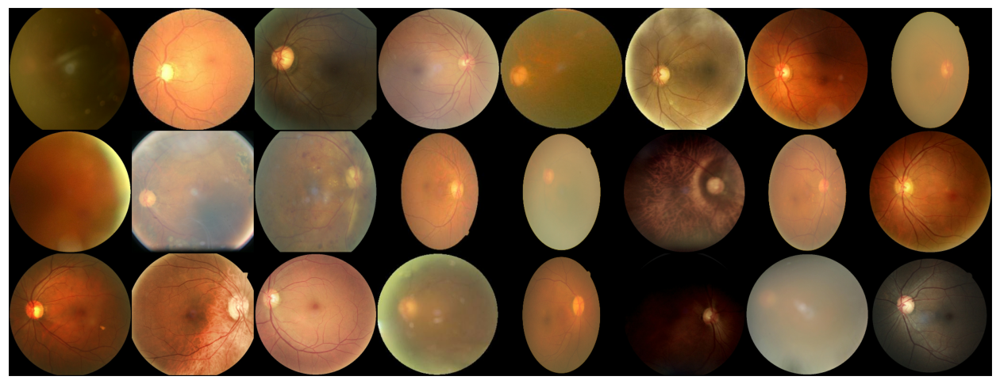

In [9]:
# Display the fundus images 

# Set seaborn style to darkgrid
sns.set_style('darkgrid')

def grid_display(dataloader, n_images=16):
    """
    Plots a single batch of a dataloader using make_grid for better visualization.
    """
    images, labels = next(iter(dataloader))  # Get a batch of images and labels
    images = images[:n_images]  # Select the first `n_images`
    
    # Convert the images from TensorFlow to NumPy format, then to PyTorch tensor
    images = torch.tensor(np.array(images)).permute(0, 3, 1, 2)  # Change format to (B, C, H, W)
    
    # Use make_grid to arrange images in a grid
    grid_img = make_grid(images, nrow=8, normalize=True)

    # Plotting
    fig, ax = plt.subplots(figsize=(16, 12))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(grid_img.permute(1, 2, 0).numpy())  # Convert back to H, W, C format for matplotlib
    plt.show()

# Visualize the training dataset using the grid display function
grid_display(train_ds, n_images=24)


In [10]:
def visualize_images(path, target_size=(256, 256), num_images=5):

    # Get a list of image filenames
    image_filenames = [f for f in os.listdir(path) if os.path.isfile(os.path.join(path, f))]

    if not image_filenames:
        raise ValueError("No images found in the specified path")

    # Select random images
    selected_images = random.sample(image_filenames, min(num_images, len(image_filenames)))

    # Create a figure and axes
    fig, axes = plt.subplots(1, num_images, figsize=(15, 3), facecolor='white')

    # Display each image
    for i, image_filename in enumerate(selected_images):
        # Load image and resize
        image_path = os.path.join(path, image_filename)
        image = Image.open(image_path)
        image = image.resize(target_size)

        # Display image
        axes[i].imshow(image)
        axes[i].axis('off')
        axes[i].set_title(image_filename)  # Set image filename as title

    # Adjust layout and display
    plt.tight_layout()
    plt.show()

## *Cataract 👁️‍🗨️*

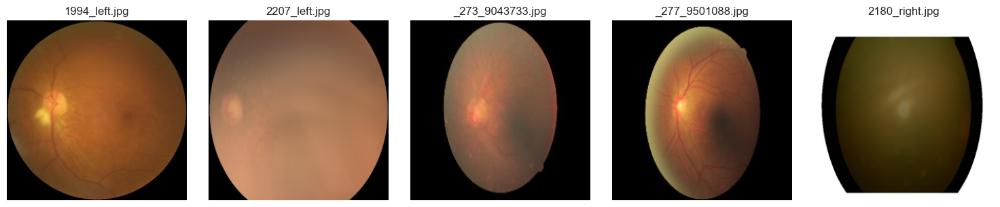

In [11]:
# Specify the path containing the images to visualize
path_to_visualize = "D:/Capstone Project/dataset/cataract"

# Visualize 5 random images
visualize_images(path_to_visualize, num_images=5)

## *Diabetic Retinopathy 👁️‍🗨️*

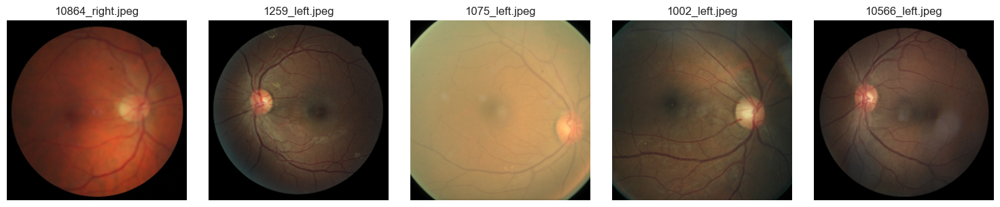

In [12]:
# Specify the path containing the images to visualize
path_to_visualize = "D:/Capstone Project/dataset/diabetic_retinopathy"

# Visualize 5 random images
visualize_images(path_to_visualize, num_images=5)

## *Glaucoma 👁️‍🗨️*

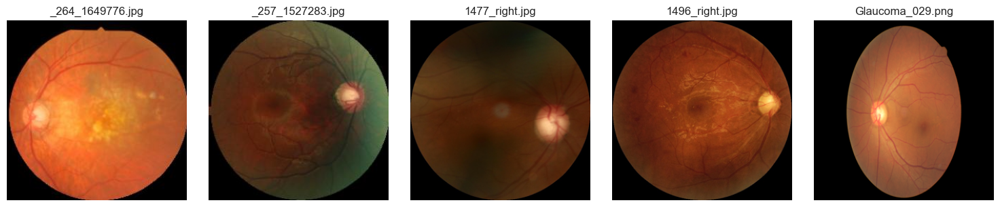

In [13]:
# Specify the path containing the images to visualize
path_to_visualize = "D:/Capstone Project/dataset/glaucoma"

# Visualize 5 random images
visualize_images(path_to_visualize, num_images=5)


## *Normal 👁️*


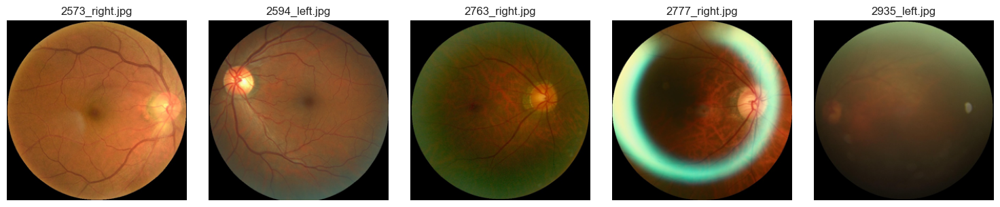

In [14]:
# Specify the path containing the images to visualize
path_to_visualize = "D:/Capstone Project/dataset/normal"

# Visualize 5 random images
visualize_images(path_to_visualize, num_images=5)

## Bar Graph 

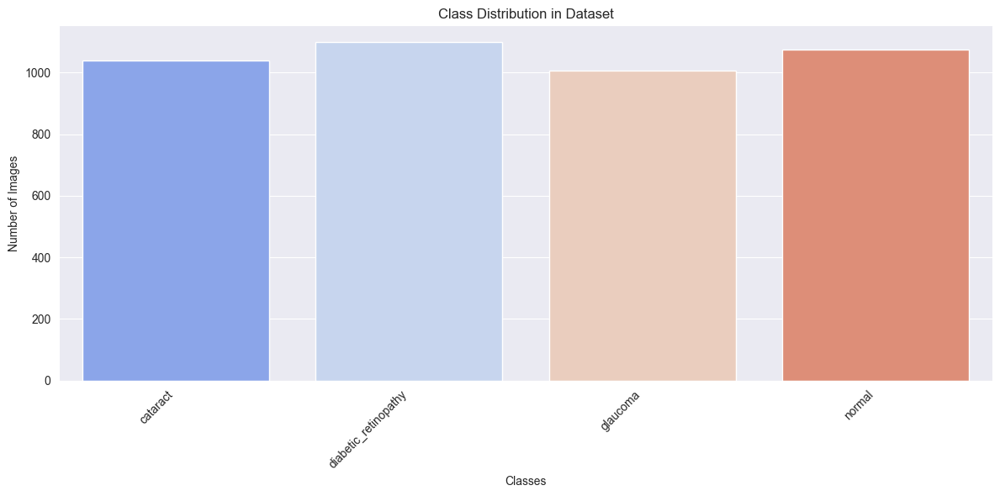

In [15]:
# Get the count of images in each class
class_counts = [len(os.listdir(os.path.join('D:/Capstone Project/dataset', class_name))) for class_name in class_names]

# Plot class distribution
plt.figure(figsize=(12, 6))
sns.barplot(x=class_names, y=class_counts, palette='coolwarm')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.title('Class Distribution in Dataset')
plt.tight_layout()
plt.show()

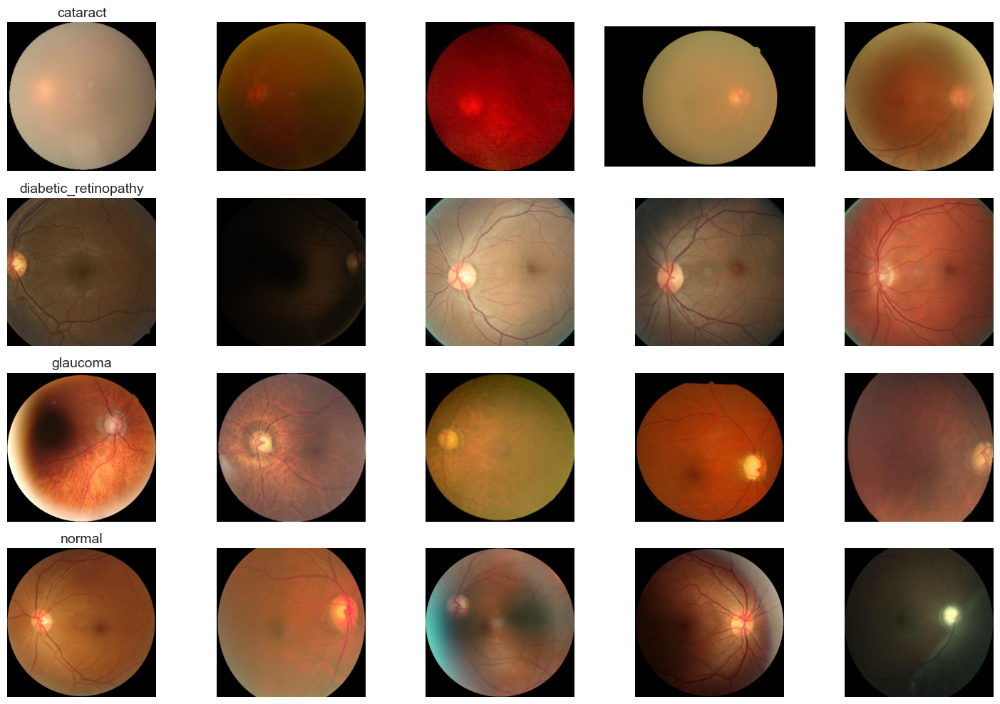

In [16]:
# Function to visualize a few random images from each class
def visualize_random_images_per_class(dataset, num_images=5):
    plt.figure(figsize=(15, 10))
    for i, class_name in enumerate(class_names):
        # Get list of all image files in the current class
        class_folder = os.path.join('D:/Capstone Project/dataset', class_name)
        image_filenames = random.sample(os.listdir(class_folder), num_images)
        
        for j, image_filename in enumerate(image_filenames):
            image_path = os.path.join(class_folder, image_filename)
            img = Image.open(image_path)
            plt.subplot(len(class_names), num_images, i * num_images + j + 1)
            plt.imshow(img)
            plt.axis('off')
            if j == 0:
                plt.title(class_name, fontsize=14)
    plt.tight_layout()
    plt.show()

# Visualize 5 random images per class
visualize_random_images_per_class(train_ds)


## Histogram

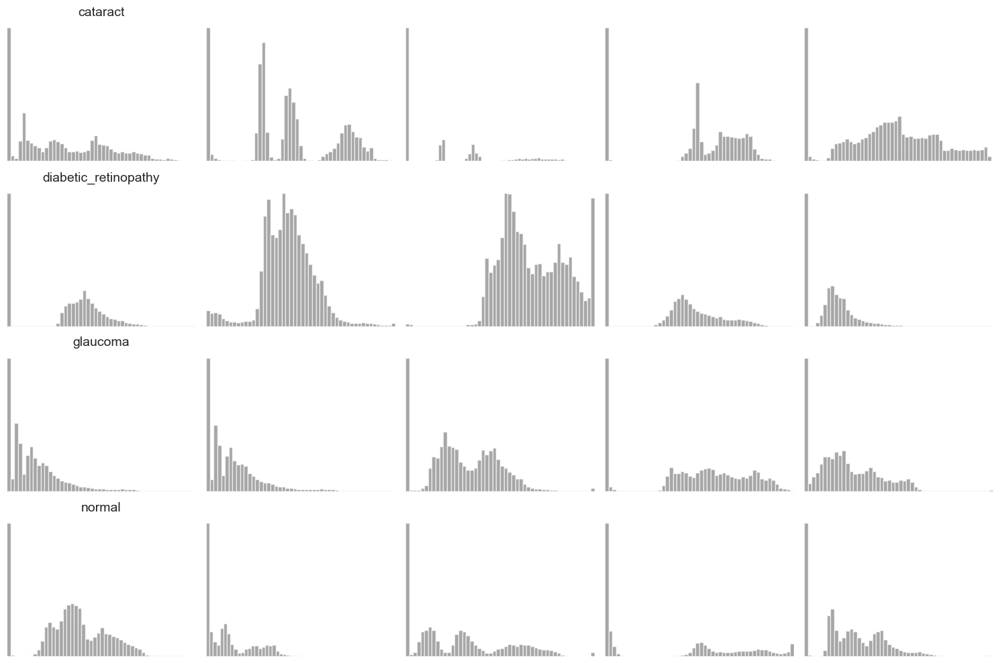

In [17]:
# Function to display histograms of pixel intensities for each class
def plot_pixel_intensity_histogram(dataset, num_images=5):
    plt.figure(figsize=(15, 10))
    for i, class_name in enumerate(class_names):
        class_folder = os.path.join('D:/Capstone Project/dataset', class_name)
        image_filenames = random.sample(os.listdir(class_folder), num_images)
        
        for j, image_filename in enumerate(image_filenames):
            img_path = os.path.join(class_folder, image_filename)
            with Image.open(img_path) as img:
                img_array = np.array(img)
                plt.subplot(len(class_names), num_images, i * num_images + j + 1)
                plt.hist(img_array.flatten(), bins=50, color='gray', alpha=0.7)
                plt.xlim([0, 255])
                plt.axis('off')
                if j == 0:
                    plt.title(class_name, fontsize=14)
    plt.tight_layout()
    plt.show()

# Visualize pixel intensity distributions for 5 images per class
plot_pixel_intensity_histogram(train_ds)

## Histograms and heatmaps

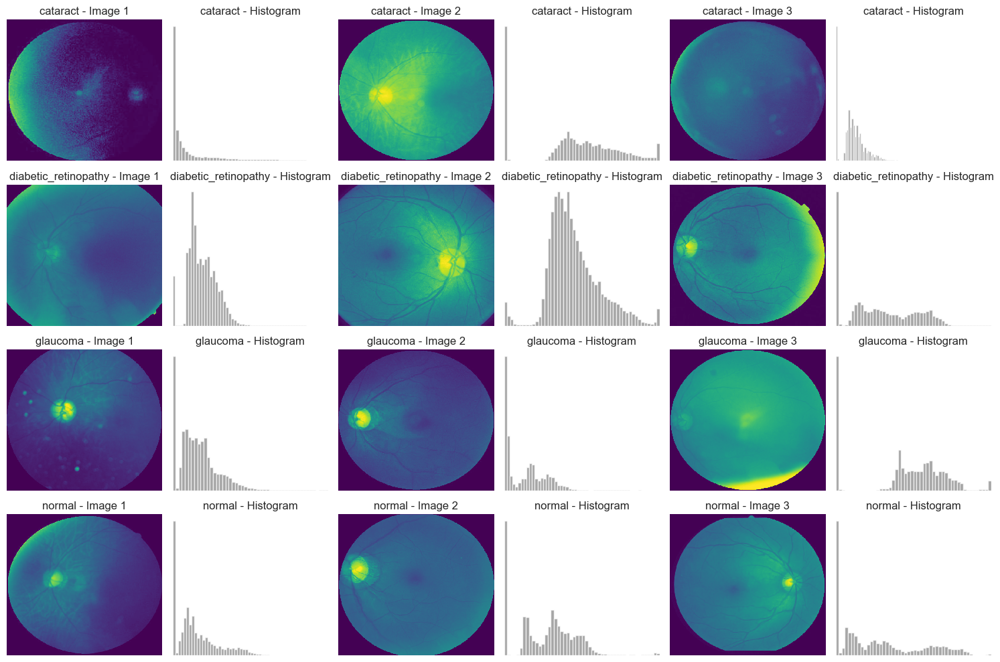

In [18]:
# Function to display histograms and heatmaps of pixel intensities for each class
def plot_pixel_intensity_histogram_and_heatmap(dataset, image_dir, num_images=5):
    # Retrieve class names from the directory structure
    class_names = os.listdir(image_dir)
    
    # Create a larger figure for the visualizations
    plt.figure(figsize=(15, 10))
    
    for i, class_name in enumerate(class_names):
        class_folder = os.path.join(image_dir, class_name)
        
        # Check if the class folder exists
        if os.path.isdir(class_folder):
            # Select random images from each class
            image_filenames = random.sample(os.listdir(class_folder), num_images)
            
            for j, image_filename in enumerate(image_filenames):
                img_path = os.path.join(class_folder, image_filename)
                
                with Image.open(img_path) as img:
                    img_array = np.array(img)
                    
                    # Plot heatmap
                    plt.subplot(len(class_names), num_images * 2, i * num_images * 2 + j * 2 + 1)
                    sns.heatmap(img_array.mean(axis=-1), cmap="viridis", cbar=False)  # Heatmap for pixel intensities
                    plt.title(f'{class_name} - Image {j+1}')
                    plt.axis('off')
                    
                    # Plot histogram
                    plt.subplot(len(class_names), num_images * 2, i * num_images * 2 + j * 2 + 2)
                    plt.hist(img_array.flatten(), bins=50, color='gray', alpha=0.7)
                    plt.xlim([0, 255])
                    plt.title(f'{class_name} - Histogram')
                    plt.axis('off')
    
    # Adjust layout to make the plots clearer
    plt.tight_layout()
    plt.show()

# Provide the path to your dataset
image_dir = 'D:/Capstone Project/dataset'

# Visualize pixel intensity distributions (heatmap and histogram) for 5 images per class
plot_pixel_intensity_histogram_and_heatmap(train_ds, image_dir, num_images=3)


## PCA (Principal Component Analysis) visualization
#### That is to project high-dimensional data (the pixel values of the images) into a 2D space to visualize the data in a simpler form.

Folder 'D:\Capstone Project\dataset\Diabetic Retinopathy' not found.


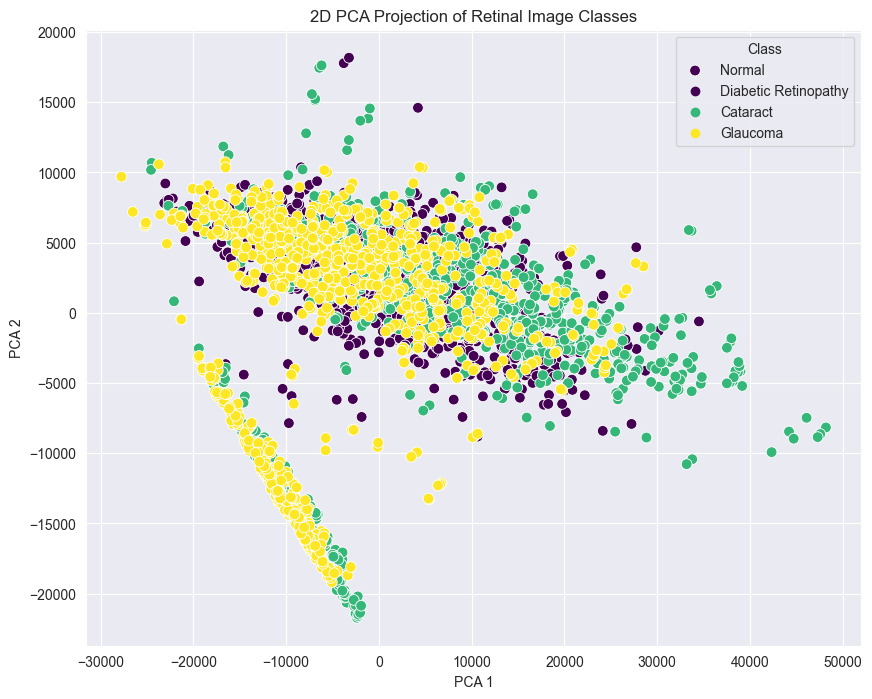

In [19]:
from sklearn.decomposition import PCA
from PIL import Image

def plot_pca_2d(dataset):
    # Load all images and flatten them into vectors
    all_images = []
    all_labels = []
    
    class_names = ['Normal', 'Diabetic Retinopathy', 'Cataract', 'Glaucoma']
    
    for class_idx, class_name in enumerate(class_names):
        class_folder = os.path.join('D:\Capstone Project\dataset', class_name)
        
        # Check if the folder exists
        if not os.path.exists(class_folder):
            print(f"Folder '{class_folder}' not found.")
            continue
        
        for image_filename in os.listdir(class_folder):
            img_path = os.path.join(class_folder, image_filename)
            with Image.open(img_path) as img:
                # Resize image to a fixed size (e.g., 224x224)
                img = img.resize((224, 224))
                img_array = np.array(img)
                all_images.append(img_array.flatten())  # Flatten the image
                all_labels.append(class_idx)
    
    all_images = np.array(all_images)
    all_labels = np.array(all_labels)
    
    # Apply PCA for dimensionality reduction
    pca = PCA(n_components=2)
    reduced_images = pca.fit_transform(all_images)
    
    # Plot the results
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=reduced_images[:, 0], y=reduced_images[:, 1], hue=all_labels, palette='viridis', s=60, marker='o')
    plt.title("2D PCA Projection of Retinal Image Classes")
    plt.xlabel("PCA 1")
    plt.ylabel("PCA 2")
    plt.legend(title='Class', labels=class_names)
    plt.show()

# Call the function
plot_pca_2d(train_ds)

## Saliency Map Visualization (Using Gradient-Based Method):
#### This visualization method highlights the regions of the image that contribute the most to the prediction. You can use gradient-based saliency maps to interpret your model.

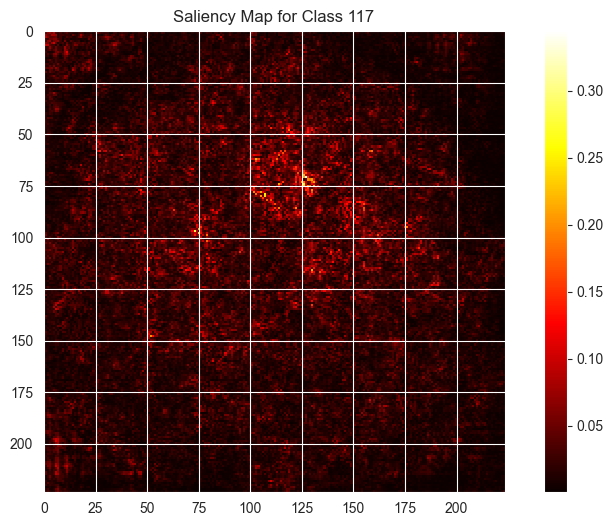

In [20]:
import torch.nn.functional as F
from torchvision import models, transforms

def visualize_saliency_map(model, image_path, transform, target_class=None):
    # Load and preprocess the image
    img = Image.open(image_path)
    img_tensor = transform(img).unsqueeze(0).requires_grad_()

    # Forward pass
    output = model(img_tensor)

    # If no target class is specified, take the class with the highest probability
    if target_class is None:
        target_class = output.argmax()

    # Backward pass to compute gradients
    model.zero_grad()
    output[0, target_class].backward()

    # Get the gradients and the image's original image
    gradients = img_tensor.grad.data[0].cpu().numpy()
    saliency_map = np.max(np.abs(gradients), axis=0)

    # Plot the saliency map
    plt.figure(figsize=(10, 6))
    plt.imshow(saliency_map, cmap='hot', interpolation='nearest')
    plt.title(f"Saliency Map for Class {target_class.item()}")
    plt.colorbar()
    plt.show()

# Define a pretrained model (ResNet18 for example)
model = models.resnet18(pretrained=True)
model.eval()

# Define image transformation for model input
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Example image path 
image_path = 'D:/Capstone Project/dataset/normal/8_left.jpg'

# Visualize saliency map for the image
visualize_saliency_map(model, image_path, transform)


## **Model Building**

In [21]:
# Splits data into 80% train and 20% test while maintaining class distribution using stratification.
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df['Labels'], random_state=42)

In [22]:
data_gen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2
)

# Creating Data Generators
train_gen = data_gen.flow_from_dataframe(
    train_df, x_col='Filepath', y_col='Labels',
    target_size=(224, 224), batch_size=32, class_mode='categorical', subset='training')

val_gen = data_gen.flow_from_dataframe(
    train_df, x_col='Filepath', y_col='Labels',
    target_size=(224, 224), batch_size=32, class_mode='categorical', subset='validation')

test_gen = ImageDataGenerator(rescale=1./255).flow_from_dataframe(
    test_df, x_col='Filepath', y_col='Labels',
    target_size=(224, 224), batch_size=32, class_mode='categorical', shuffle=False)

Found 2699 validated image filenames belonging to 4 classes.
Found 674 validated image filenames belonging to 4 classes.
Found 844 validated image filenames belonging to 4 classes.


In [23]:
# Define Model Function
def build_model(base_model, trainable_percentage=0.3):
    base_model.trainable = False
    for layer in base_model.layers[int(len(base_model.layers) * (1 - trainable_percentage)):]:
        layer.trainable = True
    
    model = Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),
        layers.Dense(512, activation='relu'),
        layers.Dropout(0.3),
        layers.Dense(len(train_gen.class_indices), activation='softmax')  # Adjust output size dynamically
    ])
    return model

## **Model Architecture**

### *Xception Model*

1. I used the Xception pretrained model for this task.

2. Xception is a deep convolutional neural network architecture that stands for "Extreme Inception." It is an improvement over InceptionV3, replacing standard convolutional layers with depthwise separable convolutions, reducing computation while maintaining high accuracy.

3. I replaced the final layer with two new dense layers. 70% of the Xception model was frozen while the remaining was kept trainable. The Xception block was trained with a learning rate of 5x10<sup>-5</sup> while the dense layers were trained with a learning rate of 8x10<sup>-4</sup>.

### *InceptionV3 Model*

1. I used the InceptionV3 pretrained model for this task.

2. InceptionV3 is a deep convolutional neural network designed to optimize computational efficiency through factorized convolutions, auxiliary classifiers, and label smoothing.

3. I replaced the final layer with two new dense layers. 70% of the InceptionV3 model was frozen while the remaining was kept trainable. The InceptionV3 block was trained with a learning rate of 5x10<sup>-5</sup> while the dense layers were trained with a learning rate of 8x10<sup>-4</sup>.

### *VGG19 Model*

1. I used the VGG19 pretrained model for this task.

2. VGG19 is a deep CNN model with 19 layers, known for its simplicity and uniform architecture using only 3x3 convolutional filters. It is computationally intensive but highly effective in feature extraction.

3. I replaced the final layer with two new dense layers. 70% of the VGG19 model was frozen while the remaining was kept trainable. The VGG19 block was trained with a learning rate of 5x10<sup>-5</sup> while the dense layers were trained with a learning rate of 8x10<sup>-4</sup>.


In [24]:
# Define Base Models
from tensorflow.keras.applications import Xception, VGG19, InceptionV3
base_models = {
    "Xception": Xception(weights="imagenet", include_top=False, input_shape=(224, 224, 3)),
    "InceptionV3": InceptionV3(weights='imagenet', include_top=False, input_shape=(224, 224, 3)),
    "VGG19": VGG19(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
}

In [25]:
best_model = None
best_acc = 0
models = {}
validation_accuracies = {}

for name, base_model in base_models.items():
    model = build_model(base_model)
    model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])
    
    history = model.fit(
        train_gen, validation_data=val_gen, epochs=7,
        callbacks=[callbacks.EarlyStopping(patience=3, restore_best_weights=True)]
    )
    
    val_acc = max(history.history['val_accuracy'])
    validation_accuracies[name] = val_acc
    models[name] = model
    
    if val_acc > best_acc:
        best_acc = val_acc
        best_model = model
        best_model_name = name
    
    # Save each model
    model.save(f'{name}_model.h5')
    print(f"Model {name} saved successfully.")

Epoch 1/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 630s 7s/step - accuracy: 0.6035 - loss: 0.9658 - val_accuracy: 0.7878 - val_loss: 0.5788
Epoch 2/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 614s 7s/step - accuracy: 0.8301 - loss: 0.4402 - val_accuracy: 0.8131 - val_loss: 0.5656
Epoch 3/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 559s 7s/step - accuracy: 0.8610 - loss: 0.3702 - val_accuracy: 0.8635 - val_loss: 0.3769
Epoch 4/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 570s 7s/step - accuracy: 0.8931 - loss: 0.2940 - val_accuracy: 0.8605 - val_loss: 0.3827
Epoch 5/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 531s 6s/step - accuracy: 0.8921 - loss: 0.2813 - val_accuracy: 0.8813 - val_loss: 0.3281
Epoch 6/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 511s 6s/step - accuracy: 0.9054 - loss: 0.2461 - val_accuracy: 0.8546 - val_loss: 0.3999
Epoch 7/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 519s 6s/step - accuracy: 0.9194 - loss: 0.2187 - val_accuracy: 0.8769 - val_loss: 0.3616


Model Xception saved successfully.
Epoch 1/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 247s 3s/step - accuracy: 0.6053 - loss: 0.9094 - val_accuracy: 0.7656 - val_loss: 0.6056
Epoch 2/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 217s 3s/step - accuracy: 0.8140 - loss: 0.4909 - val_accuracy: 0.8220 - val_loss: 0.4551
Epoch 3/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 208s 2s/step - accuracy: 0.8343 - loss: 0.4417 - val_accuracy: 0.8368 - val_loss: 0.4143
Epoch 4/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 207s 2s/step - accuracy: 0.8578 - loss: 0.3627 - val_accuracy: 0.8398 - val_loss: 0.4503
Epoch 5/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 205s 2s/step - accuracy: 0.8787 - loss: 0.3216 - val_accuracy: 0.8383 - val_loss: 0.4411
Epoch 6/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 205s 2s/step - accuracy: 0.8822 - loss: 0.3178 - val_accuracy: 0.8309 - val_loss: 0.4424


Model InceptionV3 saved successfully.
Epoch 1/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 994s 12s/step - accuracy: 0.5032 - loss: 1.0957 - val_accuracy: 0.7582 - val_loss: 0.6168
Epoch 2/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 973s 11s/step - accuracy: 0.7359 - loss: 0.6685 - val_accuracy: 0.8205 - val_loss: 0.4968
Epoch 3/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 981s 12s/step - accuracy: 0.7856 - loss: 0.5384 - val_accuracy: 0.7878 - val_loss: 0.5459
Epoch 4/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 952s 11s/step - accuracy: 0.8074 - loss: 0.5215 - val_accuracy: 0.8042 - val_loss: 0.5343
Epoch 5/7
85/85 ━━━━━━━━━━━━━━━━━━━━ 956s 11s/step - accuracy: 0.8303 - loss: 0.4538 - val_accuracy: 0.7671 - val_loss: 0.6439


Model VGG19 saved successfully.


In [26]:
# Print Validation Accuracies
print("\nValidation Accuracies:")
for name, acc in validation_accuracies.items():
    print(f"{name}: {acc:.4f}")


Validation Accuracies:
Xception: 0.8813
InceptionV3: 0.8398
VGG19: 0.8205


In [27]:
# Save Best Model
best_model.save(f'{best_model_name}_best_model.h5')
print(f"Best Model {best_model_name} saved successfully.")

Best Model Xception saved successfully.


In [28]:
# Model Summaries
for name, model in models.items():
    print(f"\nModel Summary - {name}")
    model.summary()


Model Summary - Xception


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ xception (Functional)                │ (None, 7, 7, 2048)          │      20,861,480 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4)                   │           2,052 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 45,123,558 (172.13 MB)

 Trainable params: 11,605,468 (44.27 MB)

 Non-trainable params: 10,307,152 (39.32 MB)

 Optimizer params: 23,210,938 (88.54 MB)


Model Summary - InceptionV3


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)            │ (None, 5, 5, 2048)          │      21,802,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 4)                   │           2,052 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 51,908,654 (198.02 MB)

 Trainable params: 14,527,364 (55.42 MB)

 Non-trainable params: 8,326,560 (31.76 MB)

 Optimizer params: 29,054,730 (110.84 MB)


Model Summary - VGG19


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg19 (Functional)                   │ (None, 7, 7, 512)           │      20,024,384 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 4)                   │           2,052 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 44,416,590 (169.44 MB)

 Trainable params: 12,063,748 (46.02 MB)

 Non-trainable params: 8,225,344 (31.38 MB)

 Optimizer params: 24,127,498 (92.04 MB)

In [30]:
# Get true labels
y_true = test_gen.classes
num_classes = len(test_gen.class_indices)

27/27 ━━━━━━━━━━━━━━━━━━━━ 66s 2s/step
27/27 ━━━━━━━━━━━━━━━━━━━━ 34s 1s/step
27/27 ━━━━━━━━━━━━━━━━━━━━ 175s 6s/step


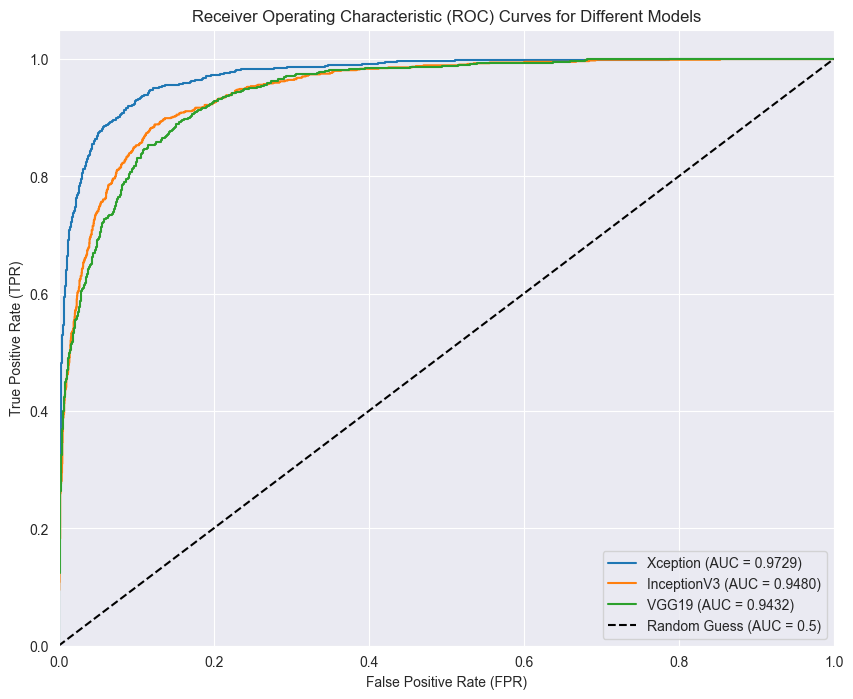

Best model based on validation accuracy: Xception
AUC of the best model: 0.9729


In [33]:
from sklearn.metrics import roc_curve, auc

# Store model results
validation_accuracies = {}
roc_data = {}

# Create the plot figure
plt.figure(figsize=(10, 8))

# Iterate through models to compute ROC curve and AUC
for name, model in models.items():
    # Evaluate the model on the test set
    loss, acc = model.evaluate(test_gen, verbose=0)
    validation_accuracies[name] = acc

    # Predict probabilities on the test set
    y_pred_probs = model.predict(test_gen)
    y_pred = np.argmax(y_pred_probs, axis=1)

    # Compute ROC curve for each class
    fpr, tpr, _ = roc_curve(tf.keras.utils.to_categorical(y_true, num_classes).ravel(), y_pred_probs.ravel())
    roc_auc = auc(fpr, tpr)
    roc_data[name] = (fpr, tpr, roc_auc)

    # Plot ROC Curve for each model with label (model name and AUC score)
    plt.plot(fpr, tpr, label=f"{name} (AUC = {roc_auc:.4f})")

    # Identify the best model based on highest accuracy
    if acc == max(validation_accuracies.values()):
        best_model_name = name
        best_model = model
        best_y_pred = y_pred

# Customize the plot for better visualization
plt.plot([0, 1], [0, 1], 'k--', label='Random Guess (AUC = 0.5)')  # Diagonal line representing random guess
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curves for Different Models')
plt.legend(loc='lower right')

# Show the plot
plt.show()

# Optionally, print the best model and its details
print(f"Best model based on validation accuracy: {best_model_name}")
print(f"AUC of the best model: {roc_data[best_model_name][2]:.4f}")


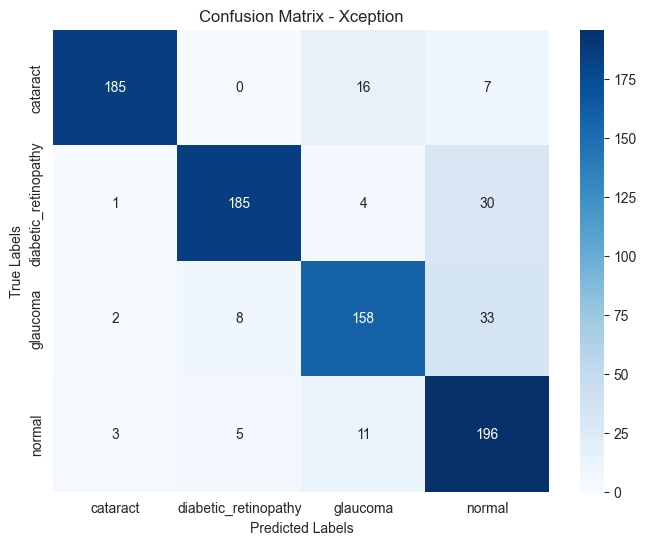

In [34]:
# Confusion Matrix and Classification Report for Best Model
cm = confusion_matrix(y_true, best_y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=test_gen.class_indices.keys(), yticklabels=test_gen.class_indices.keys())
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title(f"Confusion Matrix - {best_model_name}")
plt.show()

In [35]:
# Classification Report
report = classification_report(y_true, best_y_pred, target_names=test_gen.class_indices.keys())
print(f"Classification Report for {best_model_name}:")
print(report)

Classification Report for Xception:
                      precision    recall  f1-score   support

            cataract       0.97      0.89      0.93       208
diabetic_retinopathy       0.93      0.84      0.89       220
            glaucoma       0.84      0.79      0.81       201
              normal       0.74      0.91      0.81       215

            accuracy                           0.86       844
           macro avg       0.87      0.86      0.86       844
        weighted avg       0.87      0.86      0.86       844



In [36]:
# Convert accuracies to DataFrame
accuracy_df = pd.DataFrame(list(validation_accuracies.items()), columns=["Model", "Validation Accuracy"])
print("\nValidation Accuracies:")
print(accuracy_df)

print(f"\nBest Model: {best_model_name}")


Validation Accuracies:
         Model  Validation Accuracy
0     Xception             0.857820
1  InceptionV3             0.792654
2        VGG19             0.754739

Best Model: Xception


In [37]:
# Predictions
predictions = {name: model.predict(test_gen) for name, model in models.items()}
predictions

27/27 ━━━━━━━━━━━━━━━━━━━━ 70s 3s/step
27/27 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step
27/27 ━━━━━━━━━━━━━━━━━━━━ 176s 7s/step


{'Xception': array([[5.2866677e-04, 2.8362393e-01, 6.0233932e-02, 6.5561342e-01],
        [1.4950123e-02, 1.4834049e-02, 9.6873009e-01, 1.4857302e-03],
        [8.7621345e-05, 5.2287350e-03, 3.4218468e-05, 9.9464935e-01],
        ...,
        [6.6320999e-03, 2.8362588e-03, 9.8166990e-01, 8.8617317e-03],
        [3.9033409e-07, 9.9999142e-01, 1.8673995e-06, 6.3546790e-06],
        [9.2211598e-01, 9.7102718e-03, 1.8781193e-02, 4.9392503e-02]],
       dtype=float32),
 'InceptionV3': array([[9.42863582e-04, 8.17940384e-02, 6.15905831e-03, 9.11104083e-01],
        [4.00649533e-02, 3.93956294e-03, 9.51851368e-01, 4.14413773e-03],
        [3.16323480e-04, 6.30976111e-02, 1.79673370e-04, 9.36406434e-01],
        ...,
        [1.62133873e-02, 1.67463161e-02, 3.61546934e-01, 6.05493426e-01],
        [8.81995129e-06, 9.99622703e-01, 4.58384820e-05, 3.22524313e-04],
        [8.10252666e-01, 2.27407981e-02, 4.72973175e-02, 1.19709186e-01]],
       dtype=float32),
 'VGG19': array([[1.9003237e-03, 1.

In [38]:
# Ensemble Prediction
ensemble_predictions = np.mean(list(predictions.values()), axis=0)
ensemble_preds = np.argmax(ensemble_predictions, axis=1)
y_true = test_gen.classes

In [39]:
# Classification Report
print("\nClassification Report for Ensemble Model:")
print(classification_report(y_true, ensemble_preds, target_names=list(test_gen.class_indices.keys())))


Classification Report for Ensemble Model:
                      precision    recall  f1-score   support

            cataract       0.93      0.92      0.92       208
diabetic_retinopathy       0.97      0.81      0.89       220
            glaucoma       0.90      0.74      0.81       201
              normal       0.69      0.93      0.79       215

            accuracy                           0.85       844
           macro avg       0.87      0.85      0.85       844
        weighted avg       0.87      0.85      0.85       844



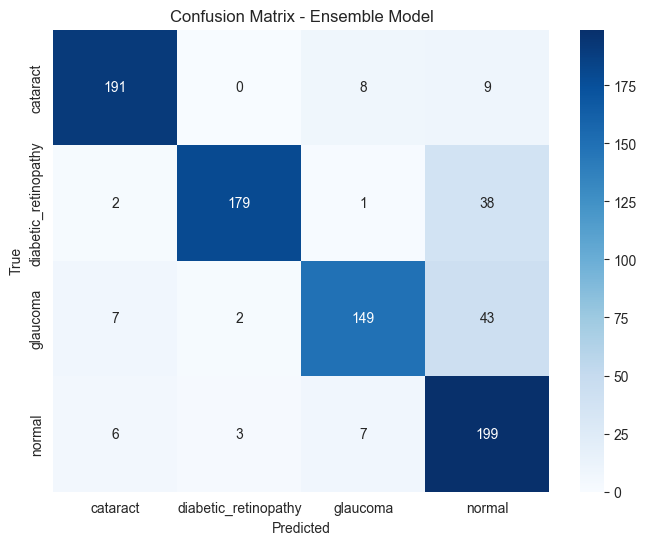

In [40]:
# Confusion Matrix
cm = confusion_matrix(y_true, ensemble_preds)
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=test_gen.class_indices.keys(), 
            yticklabels=test_gen.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix - Ensemble Model')
plt.show()

In [41]:
# Ensemble Accuracy
ensemble_accuracy = np.mean(ensemble_preds == y_true)*100
print(f"Ensemble Model Accuracy: {ensemble_accuracy:.2f}")

Ensemble Model Accuracy: 85.07


In [42]:
from tensorflow.keras.models import load_model
best_model = load_model(f'{best_model_name}_best_model.h5')

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


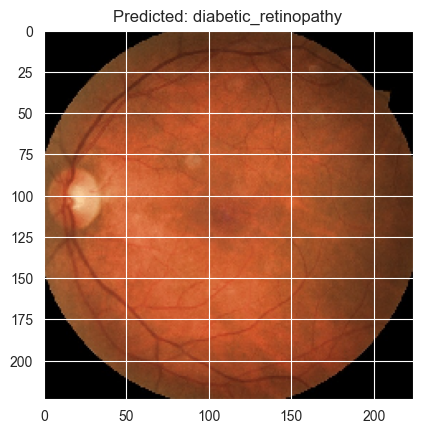

'diabetic_retinopathy'

In [43]:
# Image Prediction Function
def predict_image(image_path, model):
    img = tf.keras.preprocessing.image.load_img(image_path, target_size=(224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0
    
    prediction = model.predict(img_array)
    class_label = list(test_gen.class_indices.keys())[np.argmax(prediction)]
    
    plt.imshow(img)
    plt.title(f"Predicted: {class_label}")
    plt.show()
    return class_label

# Example Usage
predict_image("D:/Capstone Project/dataset/diabetic_retinopathy/122_left.jpeg", best_model)

In [44]:
# Evaluate the best model on the test dataset
test_loss, test_acc = best_model.evaluate(test_gen, verbose=2)
print(f"\nTest Accuracy: {test_acc:.4f}")

27/27 - 69s - 3s/step - accuracy: 0.8578 - loss: 0.4024

Test Accuracy: 0.8578


27/27 ━━━━━━━━━━━━━━━━━━━━ 70s 3s/step


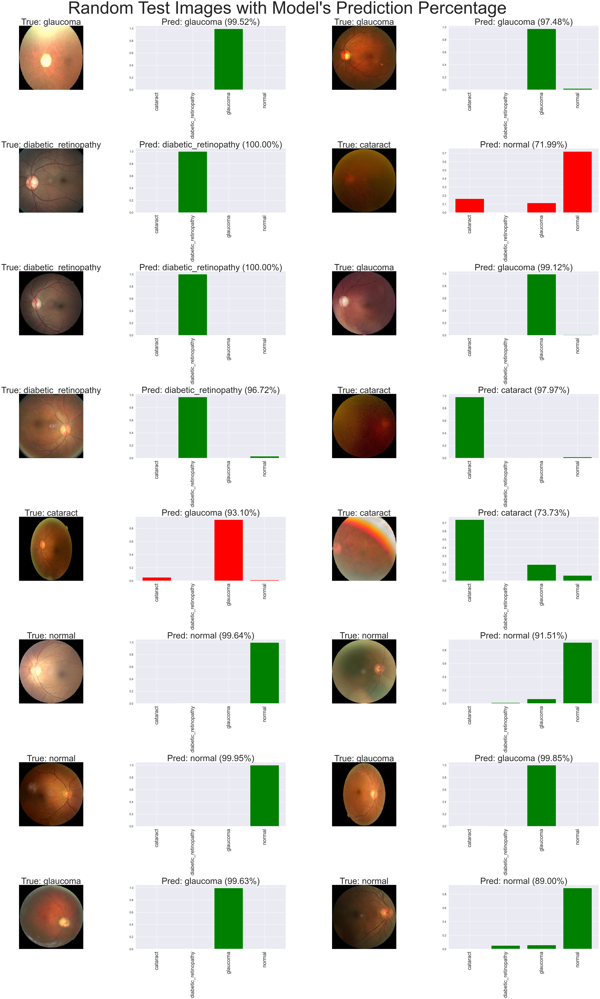

In [45]:
# Get model predictions
predictions = best_model.predict(test_gen)
y_pred_classes = np.argmax(predictions, axis=-1)  # Convert probabilities to class indices
y_true_classes = test_gen.classes  # True class labels

# Get class names
class_names = list(test_gen.class_indices.keys())

# Set seaborn plot style
sns.set_context('talk')

# Create figure for visualization (8 rows: 4 for images, 4 for bar plots)
fig, axs = plt.subplots(8, 4, figsize=(50, 80), dpi=80, constrained_layout=True)
fig.suptitle("Random Test Images with Model's Prediction Percentage", fontsize=100)

# Randomly select 16 images from the test dataset
random_indices = np.random.randint(0, len(test_gen.filenames), size=16)

for i, idx in enumerate(random_indices):
    # Load image
    img_path = test_gen.filenames[idx]
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img) / 255.0

    # True label
    true_label = class_names[y_true_classes[idx]]

    # Predicted label & confidence
    pred_probs = predictions[idx]
    pred_label = class_names[np.argmax(pred_probs)]
    pred_conf = np.max(pred_probs) * 100  # Convert to percentage

    # Display image
    axs.flat[i * 2].imshow(img_array)
    axs.flat[i * 2].set_title(f"True: {true_label}", fontsize=50)
    axs.flat[i * 2].axis("off")

    # Bar plot for prediction probabilities
    color = "green" if pred_label == true_label else "red"
    axs.flat[i * 2 + 1].bar(class_names, pred_probs, color=color)
    axs.flat[i * 2 + 1].set_xticklabels(class_names, rotation=90, fontsize=30)
    axs.flat[i * 2 + 1].set_title(f"Pred: {pred_label} ({pred_conf:.2f}%)", fontsize=50)

# Show final visualization
plt.show()


27/27 ━━━━━━━━━━━━━━━━━━━━ 67s 2s/step


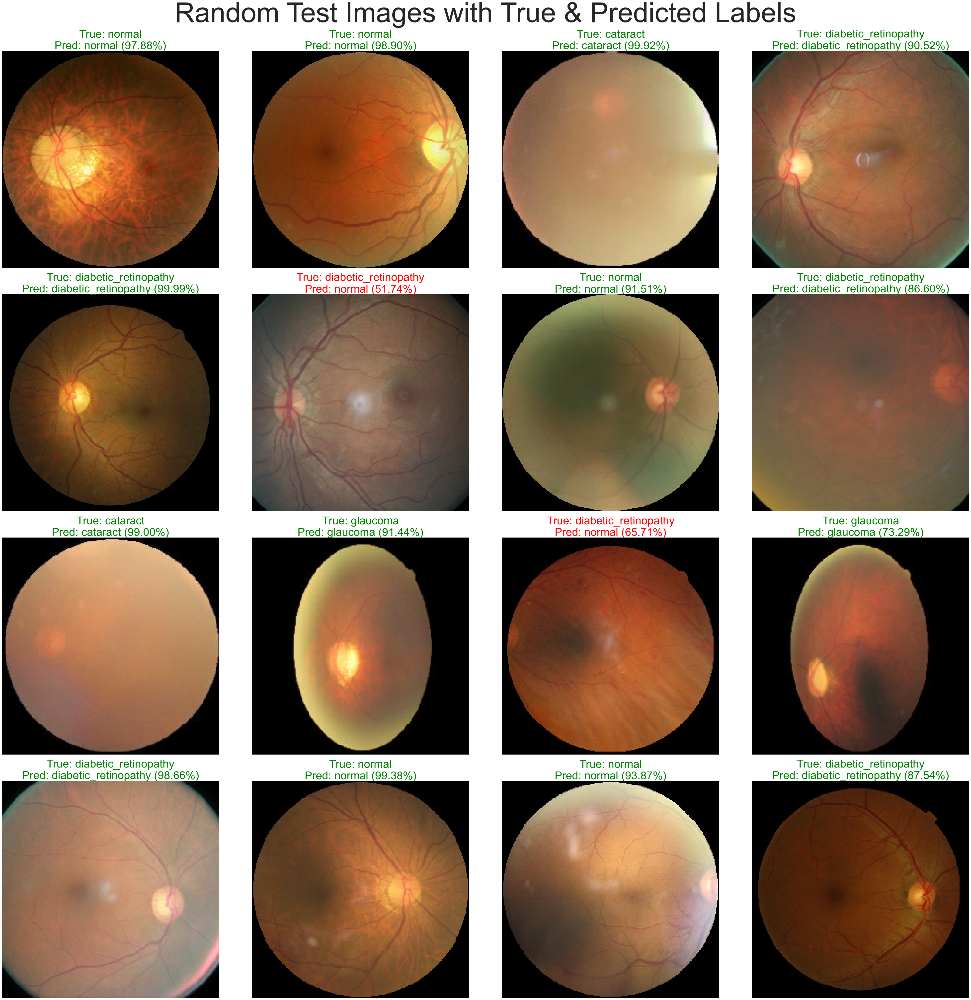

In [46]:
# Get model predictions
predictions = best_model.predict(test_gen)
y_pred_classes = np.argmax(predictions, axis=-1)  # Convert probabilities to class indices
y_true_classes = test_gen.classes  # True class labels

# Get class names
class_names = list(test_gen.class_indices.keys())

# Set seaborn plot style
sns.set_context('talk')

# Create figure for visualization
fig, axs = plt.subplots(4, 4, figsize=(50, 50), dpi=80, constrained_layout=True)
fig.suptitle("Random Test Images with True & Predicted Labels", fontsize=100)

# Randomly select 16 images from the test dataset
random_indices = np.random.randint(0, len(test_gen.filenames), size=16)

for i, idx in enumerate(random_indices):
    # Load image
    img_path = test_gen.filenames[idx]
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224, 224))
    img_array = tf.keras.preprocessing.image.img_to_array(img) / 255.0

    # True label
    true_label = class_names[y_true_classes[idx]]

    # Predicted label & confidence
    pred_probs = predictions[idx]
    pred_label = class_names[np.argmax(pred_probs)]
    pred_conf = np.max(pred_probs) * 100  # Convert to percentage

    # Color coding (green for correct, red for incorrect)
    title_color = "green" if pred_label == true_label else "red"

    # Display image
    axs.flat[i].imshow(img_array)
    axs.flat[i].set_title(f"True: {true_label}\nPred: {pred_label} ({pred_conf:.2f}%)", 
                          fontsize=40, color=title_color)
    axs.flat[i].axis("off")

# Show final visualization
plt.show()